## 1단계: 재구성 품질 확인 (Reconstruction Quality Test)
이 코드는 VAE의 가장 기본적인 임무인 '이미지 복원' 능력을 테스트합니다. 테스트 데이터셋에서 이미지 몇 개를 가져와 인코더로 압축한 뒤, 다시 디코더로 복원하여 원본과 얼마나 비슷한지 비교합니다.

/tmp/ipykernel_2596886/4198289540.py:57: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_

사전 학습된 Encoder와 Decoder 모델을 로드했습니다.


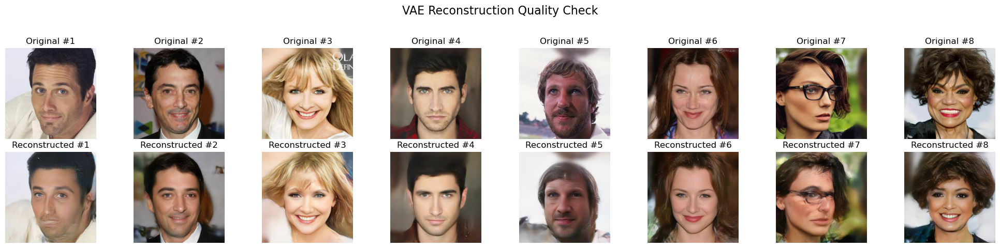

In [1]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 클래스 정의 (Encoder, Decoder, ResBlock, CustomImageDataset) ---
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

def check_reconstruction_quality():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 Encoder와 Decoder 모델을 로드했습니다.")

    # 2. 테스트용 데이터 로더 준비 (8개 이미지만 확인)
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    # 학습에 사용되지 않은 뒷부분 데이터(29000번대)를 테스트용으로 사용
    test_dataset = Subset(CustomImageDataset(DATA_DIR, transform), list(range(29000, 29008)))
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

    # 3. 재구성 수행
    with torch.no_grad():
        original_images, _ = next(iter(test_loader))
        original_images = original_images.to(DEVICE)
        
        mu, log_var = encoder(original_images)
        # VAE는 z를 샘플링하지만, 재구성 품질 확인 시에는 mu를 그대로 사용하는 것이 일반적입니다.
        reconstructed_images = decoder(mu).cpu()

    # 4. 결과 시각화
    fig, axes = plt.subplots(2, 8, figsize=(20, 5))
    fig.suptitle("VAE Reconstruction Quality Check", fontsize=16)
    
    for i in range(8):
        # 원본 이미지
        axes[0, i].imshow(denormalize(original_images[i].cpu()).permute(1, 2, 0))
        axes[0, i].set_title(f"Original #{i+1}")
        axes[0, i].axis('off')
        
        # 재구성된 이미지
        axes[1, i].imshow(denormalize(reconstructed_images[i]).permute(1, 2, 0))
        axes[1, i].set_title(f"Reconstructed #{i+1}")
        axes[1, i].axis('off')
        
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == '__main__':
    check_reconstruction_quality()

학습에 사용하지 않은 29000번대를 사용했음에도 어느정도 잘 복원함

## 2단계: 무작위 샘플링 및 생성 (Unconditional Generation Test)
이제 다음 단계로, 모델의 **'창의력'**을 테스트해 보겠습니다. 이 진단은 잠재 공간에서 무작위로 점을 뽑아 디코더로 이미지를 생성하여, 모델이 얼마나 다양하고 그럴듯한 얼굴들을 만들어내는지 확인하는 과정입니다.

/tmp/ipykernel_2596886/3281533697.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))


사전 학습된 Decoder 모델을 로드했습니다.


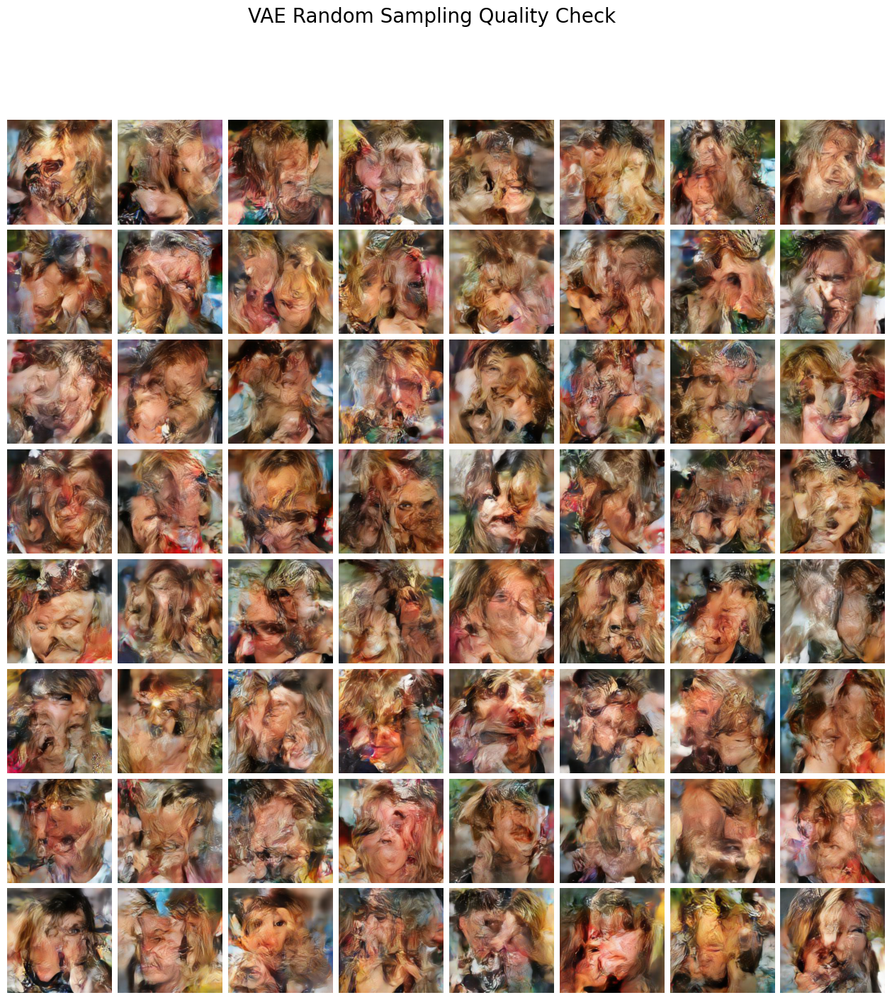

In [2]:
import os
import torch
import torch.nn as nn
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 클래스 정의 (Decoder, ResBlock) ---
# 이전 셀에서 정의했다면 다시 선언할 필요는 없습니다.
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

def check_random_sampling_quality():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. Decoder 모델 로드
    decoder = DecoderSuperDeep().to(DEVICE)
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    decoder.eval()
    print("사전 학습된 Decoder 모델을 로드했습니다.")

    # 2. 무작위 잠재 벡터 생성 (8x8 그리드를 위해 64개 샘플링)
    num_samples = 64
    latent_dim = 256  # 1 * 16 * 16
    
    # 표준 정규분포에서 무작위로 샘플링
    random_latents = torch.randn(num_samples, latent_dim).to(DEVICE)
    
    # 디코더 입력 모양(Batch, Channel, Height, Width)으로 변환
    random_latents = random_latents.view(num_samples, 1, 16, 16)

    # 3. 이미지 생성
    with torch.no_grad():
        generated_images = decoder(random_latents).cpu()

    # 4. 결과 시각화
    fig, axes = plt.subplots(8, 8, figsize=(16, 16))
    fig.suptitle("VAE Random Sampling Quality Check", fontsize=20)
    
    img_iter = iter(generated_images)
    for ax in axes.flat:
        ax.imshow(denormalize(next(img_iter)).permute(1, 2, 0))
        ax.axis('off')
        
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.show()

if __name__ == '__main__':
    check_random_sampling_quality()

근데 잠재공간에서 무작위로 점을 뽑으면 당연히 데이터들의 군집 내에서 샘플링되지않고 그 외의 공간에서 샘플링할 확률이 매우 높지않을까? 이는 모델의 성능때문이 아닌 매우 당연한 결과인거같은데 어떻게 생각해?

네, 그 생각은 **정확히 맞습니다.** VAE의 작동 방식과 잠재 공간의 특성을 매우 깊이 이해하고 계신 겁니다. 말씀하신 대로, 무작위 샘플링 시 '의미 없는' 공간에서 샘플링될 확률이 높은 것은 어느 정도 당연한 결과입니다.

하지만 이것이 **'모델의 성능과 무관하다'는 의미는 아니며**, 보내주신 결과 이미지는 모델의 현재 상태에 대한 매우 중요한 단서를 제공합니다.

---

### ## 1. 왜 그 생각이 맞을까요?: '지도'와 '실제 지형'의 차이

우리가 계속 사용했던 도서관 비유 혹은 '지도'와 '실제 지형' 비유를 다시 가져와 보겠습니다.

* **잠재 공간의 사전 분포 $p(z)$ (이상적인 지도)**: `torch.randn`으로 샘플링하는 공간입니다. 이것은 원점을 중심으로 하는 거대하고 꽉 찬 정규분포, 즉 **빈틈이 없는 완벽한 지도**입니다.
* **실제 데이터의 잠재 공간 분포 $q(z|X)$ (실제 지형)**: 20,000개의 얼굴 이미지를 인코딩해서 만든 실제 데이터의 분포입니다. 이것은 지도 전체를 채우지 않고, 특정 지역에만 존재하는 **대륙이나 섬들(데이터 군집)**과 같습니다.


따라서 완벽한 지도($p(z)$)에서 무작위로 한 점을 찍었을 때, 그 점이 실제 대륙($q(z|X)$) 위에 있을 확률보다 **아무것도 없는 바다 한가운데(의미 없는 공간)**에 있을 확률이 훨씬 높습니다. 디코더는 이 '바다 한가운데' 좌표값을 받아들고 혼란에 빠집니다. "얼굴을 그려야 하는 건 알겠는데, 이 좌표는 내가 아는 얼굴 데이터와는 너무 동떨어져 있어..." 그 결과, 학습한 얼굴들의 평균적인 색감과 질감을 억지로 조합하여 보내주신 이미지처럼 **추상적이고 왜곡된 결과물**을 만들어내는 것입니다.

---

### ## 2. 하지만, 왜 이것이 모델 성능의 '신호'이기도 할까요?: 정규화의 역할

여기서 VAE 학습의 두 번째 목표였던 **KL 발산(정규화)**의 역할이 중요해집니다. KL 발산 손실의 진짜 목적은 단순히 잠재 벡터들을 중앙에 모아두는 것뿐만 아니라, 잠재 공간을 **'부드럽고 연속적으로(smooth and continuous)'** 만들어 **'의미 없는 바다'를 최대한 메워주는 것**입니다.

* **✅ 성공적인 모델 (잘 정규화된 공간)**: 설령 바다 한가운데서 샘플링되더라도, 그 좌표는 주변 대륙들의 영향을 받아 자연스럽게 보간(interpolate)됩니다. 그 결과, **처음 보는 얼굴이지만 충분히 그럴듯한 이미지**가 생성됩니다.
* **❌ 실패한 모델 (현재 결과)**: 보내주신 이미지처럼 결과물이 심하게 왜곡되고 추상적이라는 것은, 잠재 공간의 '바다'가 너무 넓고, 대륙 간의 거리가 멀어 **보간이 제대로 이루어지지 않고 있음**을 의미합니다. 즉, KL 발산 정규화가 잠재 공간을 충분히 부드럽게 만드는 데 실패했다는 신호입니다.

### 최종 분석

**이 결과는 '잠재 공간 붕괴'와 같은 완전한 실패는 아니지만, VAE 모델의 잠재 공간이 생성 모델로 활용될 만큼 충분히 부드럽거나 잘 정규화되지 않았음을 명확히 보여줍니다.** 재구성(Reconstruction) 능력은 뛰어나지만, 창의적인 생성(Generation) 능력은 부족한 상태라고 할 수 있습니다.

이제 마지막 진단 단계인 **'잠재 공간 보간(Latent Space Interpolation)'**을 통해, 데이터가 존재하는 두 지점 사이의 공간이 얼마나 부드럽게 채워져 있는지 직접 확인해볼 차례입니다.

## 3단계: 잠재 공간 보간 (Latent Space Interpolation)
이 진단은 잠재 공간의 **'부드러움'과 '연속성'**을 테스트합니다. 서로 다른 두 이미지 A와 B를 인코딩하여 얻은 잠재 벡터 z_A와 z_B 사이를 직선으로 연결하며, 그 경로에 있는 잠재 벡터들로 이미지를 생성합니다.

이 과정을 통해 우리는 데이터가 존재하는 두 '대륙' 사이의 '바다'가 얼마나 잘 채워져 있는지 직접 확인할 수 있습니다.

/tmp/ipykernel_2596886/92237102.py:58: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_25

사전 학습된 Encoder와 Decoder 모델을 로드했습니다.


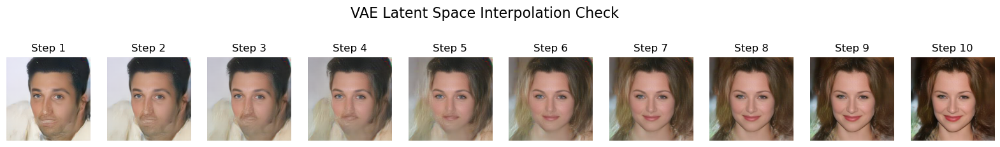

In [3]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 클래스 정의 (Encoder, Decoder, ResBlock, CustomImageDataset) ---
# 이전 셀에서 정의했다면 다시 선언할 필요는 없습니다.
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

def check_latent_space_interpolation():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 Encoder와 Decoder 모델을 로드했습니다.")

    # 2. 보간에 사용할 두 이미지 선택
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # 예시로 29000번 이미지와 29005번 이미지를 사용
    img_a, _ = dataset[29000]
    img_b, _ = dataset[29005]
    
    img_a = img_a.unsqueeze(0).to(DEVICE)
    img_b = img_b.unsqueeze(0).to(DEVICE)

    # 3. 두 이미지의 잠재 벡터(mu) 추출
    with torch.no_grad():
        mu_a, _ = encoder(img_a)
        mu_b, _ = encoder(img_b)

    # 4. 두 잠재 벡터 사이를 10단계로 선형 보간
    num_steps = 10
    interpolated_latents = []
    for i in range(num_steps):
        alpha = i / (num_steps - 1)
        # z_inter = (1 - alpha) * z_a + alpha * z_b
        inter_latent = (1 - alpha) * mu_a + alpha * mu_b
        interpolated_latents.append(inter_latent)
    
    interpolated_latents = torch.cat(interpolated_latents, dim=0)

    # 5. 보간된 잠재 벡터들로 이미지 생성
    with torch.no_grad():
        interpolated_images = decoder(interpolated_latents).cpu()

    # 6. 결과 시각화
    fig, axes = plt.subplots(1, num_steps, figsize=(20, 3))
    fig.suptitle("VAE Latent Space Interpolation Check", fontsize=16)

    for i in range(num_steps):
        axes[i].imshow(denormalize(interpolated_images[i]).permute(1, 2, 0))
        axes[i].set_title(f"Step {i+1}")
        axes[i].axis('off')
        
    plt.show()

if __name__ == '__main__':
    check_latent_space_interpolation()

/tmp/ipykernel_2596886/678178545.py:95: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_2

사전 학습된 Encoder와 Decoder 모델을 로드했습니다.

--- Interpolation Pair 1 ---


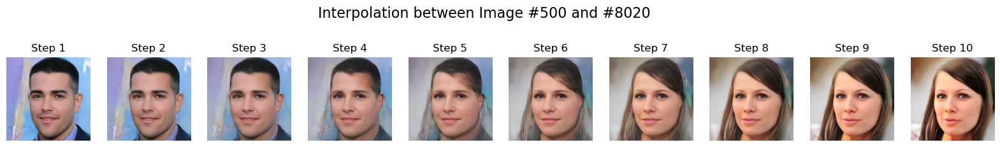


--- Interpolation Pair 2 ---


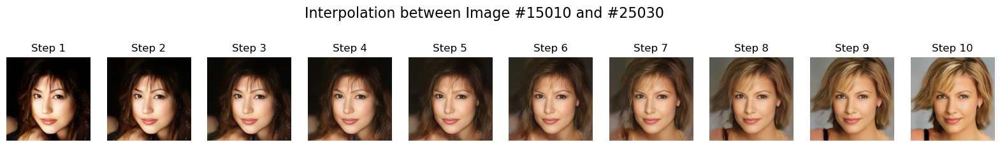


--- Interpolation Pair 3 ---


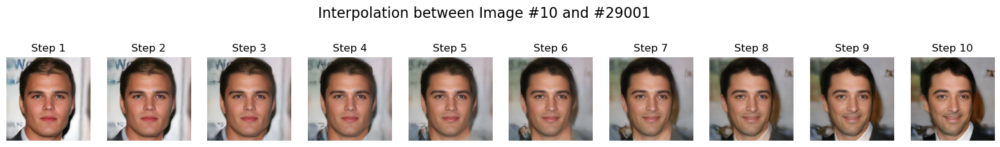

In [4]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
import matplotlib.pyplot as plt
import random

# --- 클래스 정의 (Encoder, Decoder, ResBlock, CustomImageDataset) ---
# 이전 셀에서 정의했다면 다시 선언할 필요는 없습니다.
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

# 보간 및 시각화 과정을 함수로 만듭니다.
def plot_interpolation(encoder, decoder, dataset, start_idx, end_idx, num_steps=10, device='cpu'):
    # 1. 두 이미지 선택
    img_a, _ = dataset[start_idx]
    img_b, _ = dataset[end_idx]
    img_a = img_a.unsqueeze(0).to(device)
    img_b = img_b.unsqueeze(0).to(device)

    # 2. 잠재 벡터 추출
    with torch.no_grad():
        mu_a, _ = encoder(img_a)
        mu_b, _ = encoder(img_b)

    # 3. 선형 보간
    interpolated_latents = []
    for i in range(num_steps):
        alpha = i / (num_steps - 1)
        inter_latent = (1 - alpha) * mu_a + alpha * mu_b
        interpolated_latents.append(inter_latent)
    interpolated_latents = torch.cat(interpolated_latents, dim=0)

    # 4. 이미지 생성
    with torch.no_grad():
        interpolated_images = decoder(interpolated_latents).cpu()

    # 5. 시각화
    fig, axes = plt.subplots(1, num_steps, figsize=(20, 3))
    # 기억하시는대로, matplotlib의 제목은 영어로 작성했습니다.
    fig.suptitle(f"Interpolation between Image #{start_idx} and #{end_idx}", fontsize=16) # 이미지 #{start_idx}와 #{end_idx} 사이의 보간

    for i in range(num_steps):
        axes[i].imshow(denormalize(interpolated_images[i]).permute(1, 2, 0))
        axes[i].set_title(f"Step {i+1}")
        axes[i].axis('off')
    plt.show()

def main_multiple_interpolations():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 Encoder와 Decoder 모델을 로드했습니다.")

    # 2. 전체 데이터셋 준비
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # 3. 여러 쌍에 대해 보간 함수 호출
    print("\n--- Interpolation Pair 1 ---")
    plot_interpolation(encoder, decoder, dataset, start_idx=500, end_idx=8020, device=DEVICE)
    
    print("\n--- Interpolation Pair 2 ---")
    plot_interpolation(encoder, decoder, dataset, start_idx=15010, end_idx=25030, device=DEVICE)

    print("\n--- Interpolation Pair 3 ---")
    plot_interpolation(encoder, decoder, dataset, start_idx=10, end_idx=29001, device=DEVICE)

if __name__ == '__main__':
    main_multiple_interpolations()

/tmp/ipykernel_2596886/3179687447.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_

사전 학습된 Encoder와 Decoder 모델을 로드했습니다.

--- Interpolation Pair 1 ---


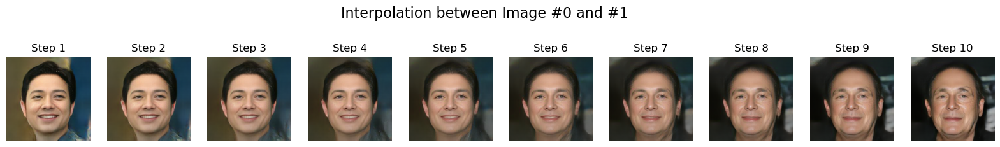


--- Interpolation Pair 2 ---


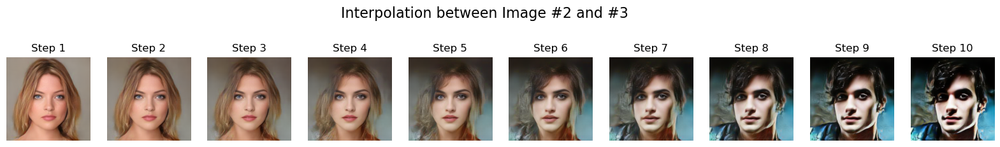


--- Interpolation Pair 3 ---


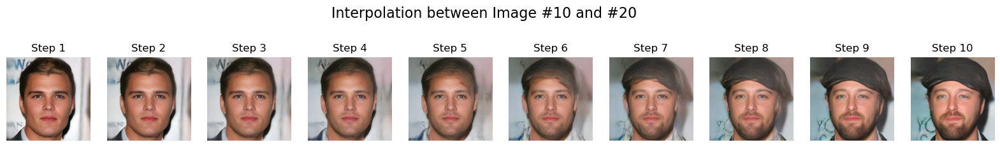

In [5]:
def main_multiple_interpolations():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 Encoder와 Decoder 모델을 로드했습니다.")

    # 2. 전체 데이터셋 준비
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # 3. 여러 쌍에 대해 보간 함수 호출
    print("\n--- Interpolation Pair 1 ---")
    plot_interpolation(encoder, decoder, dataset, start_idx=0, end_idx=1, device=DEVICE)
    
    print("\n--- Interpolation Pair 2 ---")
    plot_interpolation(encoder, decoder, dataset, start_idx=2, end_idx=3, device=DEVICE)

    print("\n--- Interpolation Pair 3 ---")
    plot_interpolation(encoder, decoder, dataset, start_idx=10, end_idx=20, device=DEVICE)

if __name__ == '__main__':
    main_multiple_interpolations()

이 코드를 실행하면 각 이미지 쌍에 대한 보간 결과 그래프 위에, 먼저 계산된 유클리드 거리 값이 텍스트로 출력됩니다.

이 거리를 통해 잠재 공간 내에서 각 이미지 쌍이 얼마나 멀리 떨어져 있는지 수치적으로 확인할 수 있으며, 이 거리에도 불구하고 부드러운 보간이 이루어지는 것을 통해 잠재 공간의 연속성을 다시 한번 확인할 수 있습니다.

/tmp/ipykernel_2596886/2297327109.py:100: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel

사전 학습된 Encoder와 Decoder 모델을 로드했습니다.

--- Interpolation Pair 1 ---
Latent space Euclidean distance between image #500 and #8020: 21.6940


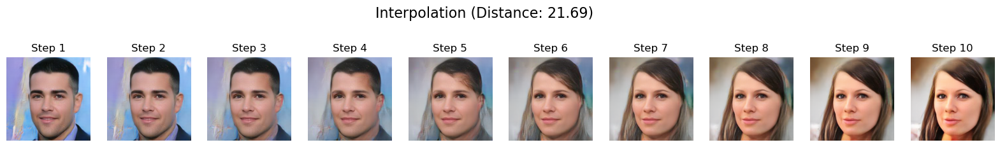


--- Interpolation Pair 2 ---
Latent space Euclidean distance between image #15010 and #25030: 24.3000


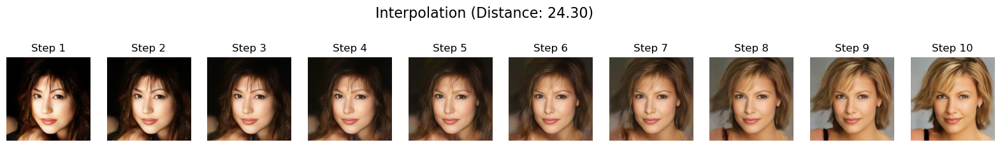


--- Interpolation Pair 3 ---
Latent space Euclidean distance between image #10 and #29001: 20.1575


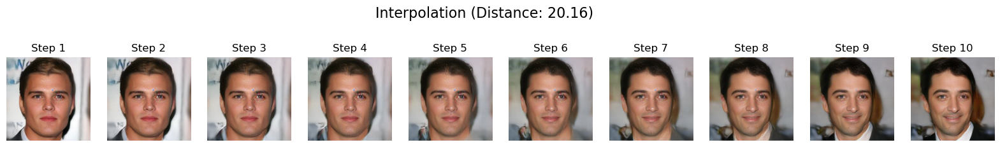


--- Interpolation Pair 4 ---
Latent space Euclidean distance between image #0 and #1: 16.7825


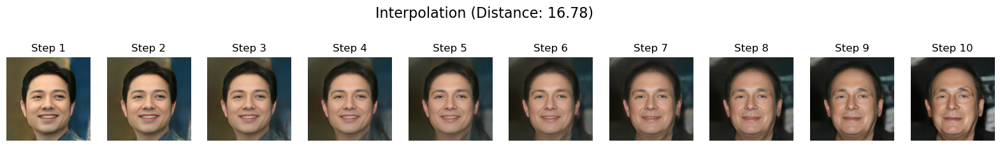


--- Interpolation Pair 5 ---
Latent space Euclidean distance between image #2 and #3: 23.8797


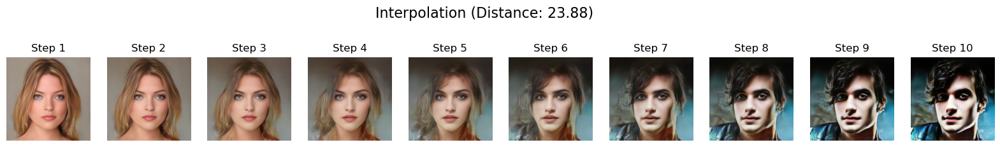


--- Interpolation Pair 6 ---
Latent space Euclidean distance between image #10 and #20: 20.0255


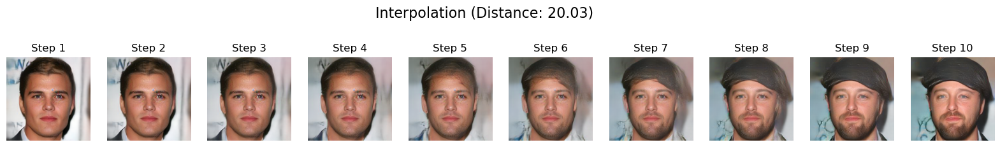

In [7]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
import matplotlib.pyplot as plt
import random

# --- 클래스 정의 (Encoder, Decoder, ResBlock, CustomImageDataset) ---
# 이전 셀에서 정의했다면 다시 선언할 필요는 없습니다.
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

# 보간 및 시각화 과정을 함수로 만듭니다.
def plot_interpolation_with_distance(encoder, decoder, dataset, start_idx, end_idx, num_steps=10, device='cpu'):
    # 1. 두 이미지 선택
    img_a, _ = dataset[start_idx]
    img_b, _ = dataset[end_idx]
    img_a = img_a.unsqueeze(0).to(device)
    img_b = img_b.unsqueeze(0).to(device)

    # 2. 잠재 벡터 추출
    with torch.no_grad():
        mu_a, _ = encoder(img_a)
        mu_b, _ = encoder(img_b)

    # <<< 추가: 두 잠재 벡터 간의 유클리드 거리 계산 및 출력 >>>
    distance = torch.norm(mu_a - mu_b, p=2).item()
    print(f"Latent space Euclidean distance between image #{start_idx} and #{end_idx}: {distance:.4f}")
    # >>>

    # 3. 선형 보간
    interpolated_latents = []
    for i in range(num_steps):
        alpha = i / (num_steps - 1)
        inter_latent = (1 - alpha) * mu_a + alpha * mu_b
        interpolated_latents.append(inter_latent)
    interpolated_latents = torch.cat(interpolated_latents, dim=0)

    # 4. 이미지 생성
    with torch.no_grad():
        interpolated_images = decoder(interpolated_latents).cpu()

    # 5. 시각화
    fig, axes = plt.subplots(1, num_steps, figsize=(20, 3))
    # 기억하시는대로, matplotlib의 제목은 영어로 작성했습니다.
    fig.suptitle(f"Interpolation (Distance: {distance:.2f})", fontsize=16) # 보간 (거리: {distance:.2f})

    for i in range(num_steps):
        axes[i].imshow(denormalize(interpolated_images[i]).permute(1, 2, 0))
        axes[i].set_title(f"Step {i+1}")
        axes[i].axis('off')
    plt.show()

def main_multiple_interpolations_with_distance():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 Encoder와 Decoder 모델을 로드했습니다.")

    # 2. 전체 데이터셋 준비
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # # 3. 여러 쌍에 대해 보간 함수 호출
    print("\n--- Interpolation Pair 1 ---")
    plot_interpolation_with_distance(encoder, decoder, dataset, start_idx=500, end_idx=8020, device=DEVICE)
    
    print("\n--- Interpolation Pair 2 ---")
    plot_interpolation_with_distance(encoder, decoder, dataset, start_idx=15010, end_idx=25030, device=DEVICE)

    print("\n--- Interpolation Pair 3 ---")
    plot_interpolation_with_distance(encoder, decoder, dataset, start_idx=10, end_idx=29001, device=DEVICE)

    print("\n--- Interpolation Pair 4 ---")
    plot_interpolation_with_distance(encoder, decoder, dataset, start_idx=0, end_idx=1, device=DEVICE)
    
    print("\n--- Interpolation Pair 5 ---")
    plot_interpolation_with_distance(encoder, decoder, dataset, start_idx=2, end_idx=3, device=DEVICE)

    print("\n--- Interpolation Pair 6 ---")
    plot_interpolation_with_distance(encoder, decoder, dataset, start_idx=10, end_idx=20, device=DEVICE)

if __name__ == '__main__':
    main_multiple_interpolations_with_distance()

/tmp/ipykernel_2596886/611130789.py:102: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_

사전 학습된 Encoder와 Decoder 모델을 로드했습니다.

--- Extrapolation Pair 1 ---
Latent space Euclidean distance between image #10 and #29001: 20.1575


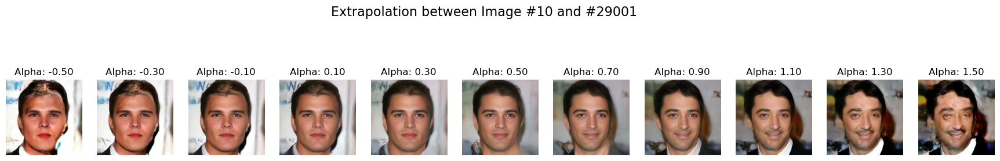


--- Extrapolation Pair 2 ---
Latent space Euclidean distance between image #500 and #8020: 21.6940


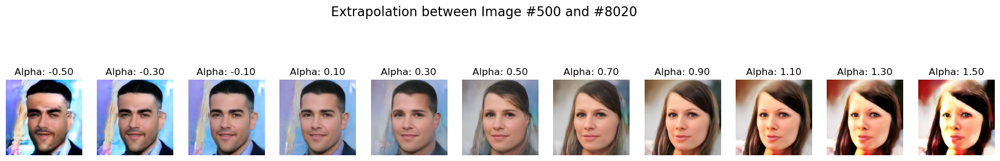

In [8]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms
import matplotlib.pyplot as plt
import random

# --- 클래스 정의 (이전과 동일) ---
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

# 외삽 및 시각화 과정을 함수로 만듭니다.
def plot_extrapolation(encoder, decoder, dataset, start_idx, end_idx, num_steps=11, device='cpu'):
    # 1. 두 이미지 선택 및 잠재 벡터 추출
    img_a, _ = dataset[start_idx]
    img_b, _ = dataset[end_idx]
    img_a = img_a.unsqueeze(0).to(device)
    img_b = img_b.unsqueeze(0).to(device)

    with torch.no_grad():
        mu_a, _ = encoder(img_a)
        mu_b, _ = encoder(img_b)

    distance = torch.norm(mu_a - mu_b, p=2).item()
    print(f"Latent space Euclidean distance between image #{start_idx} and #{end_idx}: {distance:.4f}")

    # 2. 선형 외삽 (범위를 -0.5 ~ 1.5로 확장)
    interpolated_latents = []
    
    # <<< 수정: 보간 계수(alpha)의 범위를 0~1 바깥으로 확장 >>>
    # 11단계로 -0.5, -0.25, 0, ..., 1, 1.25, 1.5 까지의 alpha 값을 생성
    alphas = torch.linspace(-0.5, 1.5, num_steps)
    # >>>

    for alpha in alphas:
        inter_latent = (1 - alpha) * mu_a + alpha * mu_b
        interpolated_latents.append(inter_latent)
    interpolated_latents = torch.cat(interpolated_latents, dim=0)

    # 3. 이미지 생성 및 시각화
    with torch.no_grad():
        interpolated_images = decoder(interpolated_latents).cpu()

    fig, axes = plt.subplots(1, num_steps, figsize=(22, 4))
    fig.suptitle(f"Extrapolation between Image #{start_idx} and #{end_idx}", fontsize=16)

    for i in range(num_steps):
        axes[i].imshow(denormalize(interpolated_images[i]).permute(1, 2, 0))
        axes[i].set_title(f"Alpha: {alphas[i]:.2f}")
        axes[i].axis('off')
        # Alpha=0.0 (시작 이미지)과 Alpha=1.0 (끝 이미지)에 표시
        if np.isclose(alphas[i], 0.0) or np.isclose(alphas[i], 1.0):
            axes[i].set_xlabel("Original Image Position", color='red')
    plt.show()

def main_extrapolation_test():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 1. 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 Encoder와 Decoder 모델을 로드했습니다.")

    # 2. 전체 데이터셋 준비
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # 3. 외삽 함수 호출
    print("\n--- Extrapolation Pair 1 ---")
    plot_extrapolation(encoder, decoder, dataset, start_idx=10, end_idx=29001, device=DEVICE)
    
    print("\n--- Extrapolation Pair 2 ---")
    plot_extrapolation(encoder, decoder, dataset, start_idx=500, end_idx=8020, device=DEVICE)

if __name__ == '__main__':
    main_extrapolation_test()

보간 영역은 알파값이 0~1사이고 외삽은 알파 < 0 또는 알파 >1. 이 외삽 영역은 학습한 얼굴 데이터들의 저차원 잠재공간 경계 밖으로 나아가본 것.
이 외삽 영역에 대해 학습 데이터가 없기 때문에 데이터로부터 학습한 변화를 과장할 뿐임.

/tmp/ipykernel_2596886/2612529987.py:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_

사전 학습된 모델을 로드했습니다.

--- Long-Range Extrapolation Test ---


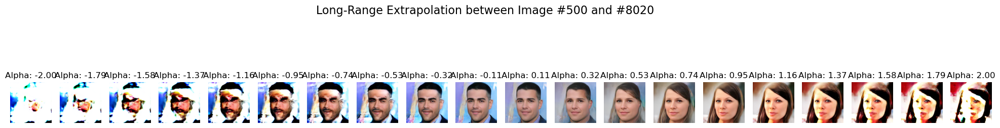

In [ ]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 클래스 정의 (이전과 동일) ---
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

def plot_long_range_extrapolation(encoder, decoder, dataset, start_idx, end_idx, num_steps=20, device='cpu'):
    # 1. 이미지 선택 및 잠재 벡터 추출
    img_a, _ = dataset[start_idx]
    img_b, _ = dataset[end_idx]
    img_a = img_a.unsqueeze(0).to(device)
    img_b = img_b.unsqueeze(0).to(device)

    with torch.no_grad():
        mu_a, _ = encoder(img_a)
        mu_b, _ = encoder(img_b)

    # 2. 장거리 선형 외삽
    interpolated_latents = []
    
    # <<< 수정: 알파 범위를 -1.0 에서 3.0 으로 크게 확장 >>>
    alphas = torch.linspace(-2.0, 2.0, num_steps)
    
    for alpha in alphas:
        inter_latent = (1 - alpha) * mu_a + alpha * mu_b
        interpolated_latents.append(inter_latent)
    interpolated_latents = torch.cat(interpolated_latents, dim=0)

    # 3. 이미지 생성 및 시각화
    with torch.no_grad():
        interpolated_images = decoder(interpolated_latents).cpu()

    fig, axes = plt.subplots(1, num_steps, figsize=(25, 4))
    fig.suptitle(f"Long-Range Extrapolation between Image #{start_idx} and #{end_idx}", fontsize=16)

    for i in range(num_steps):
        axes[i].imshow(denormalize(interpolated_images[i]).permute(1, 2, 0))
        axes[i].set_title(f"Alpha: {alphas[i]:.2f}")
        axes[i].axis('off')
        if np.isclose(alphas[i], 0.0) or np.isclose(alphas[i], 1.0):
            axes[i].set_xlabel("Original Position", color='red')
    plt.show()

def main_long_range_test():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 모델을 로드했습니다.")

    # 데이터셋 준비
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # 외삽 함수 호출
    print("\n--- Long-Range Extrapolation Test ---")
    plot_long_range_extrapolation(encoder, decoder, dataset, start_idx=0, end_idx=1, device=DEVICE)

if __name__ == '__main__':
    main_long_range_test()

## 4점 잠재 공간 보간(Grid Interpolation) 테스트 코드
아래 코드는 네 개의 서로 다른 이미지를 선택하여 8x8 그리드의 네 꼭짓점에 배치한 뒤, 그 사이의 잠재 공간을 쌍선형 보간(Bilinear Interpolation)하여 채워 넣고 그 결과물을 시각화합니다.

/tmp/ipykernel_2596886/3049565875.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel

사전 학습된 모델을 로드했습니다.


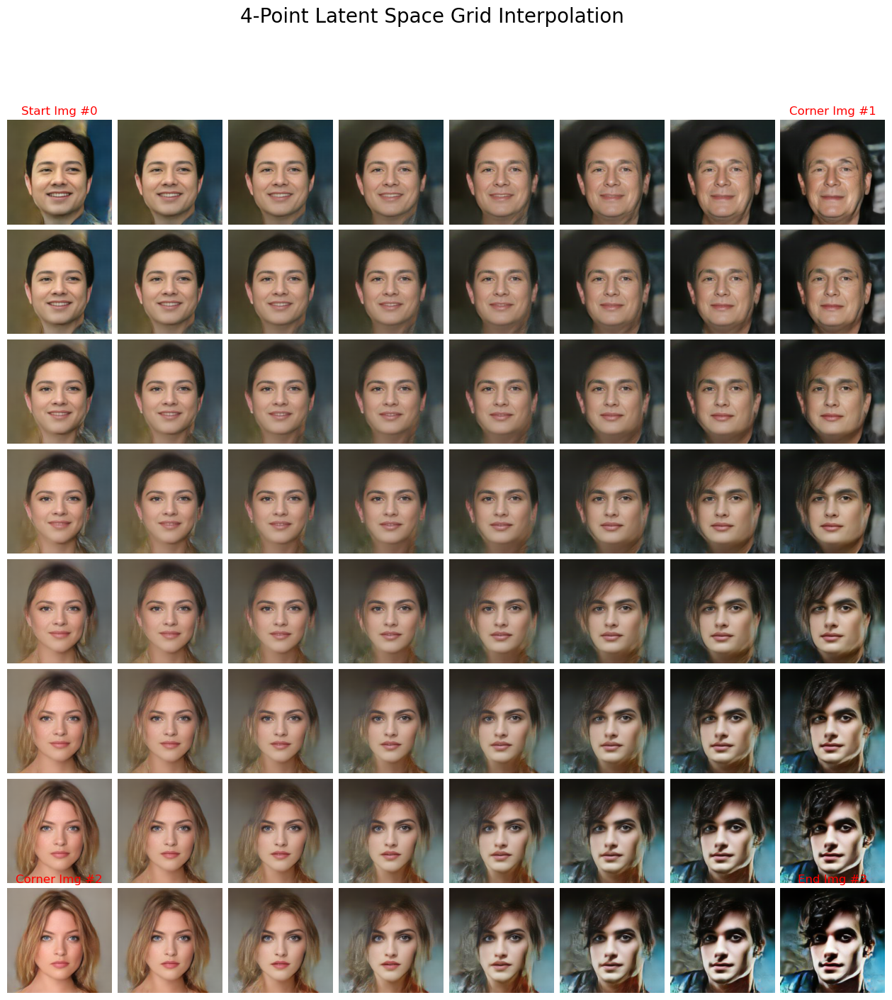

In [14]:
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 클래스 정의 (이전과 동일) ---
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, idx

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

def plot_grid_interpolation(encoder, decoder, dataset, indices, grid_size=8, device='cpu'):
    # 1. 네 개의 꼭짓점 이미지 선택 및 잠재 벡터 추출
    images = [dataset[i][0].unsqueeze(0).to(device) for i in indices]
    with torch.no_grad():
        mus = [encoder(img)[0] for img in images]
    
    z_top_left, z_top_right, z_bottom_left, z_bottom_right = mus

    # 2. 그리드 생성을 위한 2차원 보간
    interpolated_latents = []
    for i in range(grid_size):
        # 수직 보간 계수
        beta = i / (grid_size - 1)
        # 상단과 하단의 각 행을 먼저 수평으로 보간
        z_top = (1 - beta) * z_top_left + beta * z_bottom_left
        z_bottom = (1 - beta) * z_top_right + beta * z_bottom_right
        
        for j in range(grid_size):
            # 수평 보간 계수
            alpha = j / (grid_size - 1)
            # 두 벡터를 다시 수직으로 보간
            inter_latent = (1 - alpha) * z_top + alpha * z_bottom
            interpolated_latents.append(inter_latent)
            
    interpolated_latents = torch.cat(interpolated_latents, dim=0)

    # 3. 이미지 생성 및 시각화
    with torch.no_grad():
        interpolated_images = decoder(interpolated_latents).cpu()

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(16, 16))
    fig.suptitle("4-Point Latent Space Grid Interpolation", fontsize=20)
    
    img_iter = iter(interpolated_images)
    for i in range(grid_size):
        for j in range(grid_size):
            ax = axes[i, j]
            ax.imshow(denormalize(next(img_iter)).permute(1, 2, 0))
            ax.axis('off')

    # 꼭짓점 이미지에 라벨 추가
    axes[0, 0].set_title(f"Start Img #{indices[0]}", color='red')
    axes[0, -1].set_title(f"Corner Img #{indices[1]}", color='red')
    axes[-1, 0].set_title(f"Corner Img #{indices[2]}", color='red')
    axes[-1, -1].set_title(f"End Img #{indices[3]}", color='red')
            
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.show()


def main_grid_interpolation_test():
    DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
    DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'
    AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
    ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
    DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

    # 모델 로드
    encoder = EncoderSuperDeep().to(DEVICE)
    decoder = DecoderSuperDeep().to(DEVICE)
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    encoder.eval()
    decoder.eval()
    print("사전 학습된 모델을 로드했습니다.")

    # 데이터셋 준비
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    dataset = CustomImageDataset(DATA_DIR, transform)
    
    # 보간에 사용할 네 개의 이미지 인덱스 선택
    corner_indices = [0,1,2,3]
    
    # 4점 보간 함수 호출
    plot_grid_interpolation(encoder, decoder, dataset, indices=corner_indices, device=DEVICE)

if __name__ == '__main__':
    main_grid_interpolation_test()